In [30]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib as mpl
mpl.rcParams['figure.figsize'] = 20, 20
plt = mpl.pyplot
imshow = plt.imshow

import rawpy
import numpy as np

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Setup: Reading the Image

In [31]:
input_paths = (
    # "../data/test_images/felix_2.iiq",
    # "../data/test_images/lea.iiq",
    # "../data/test_images/richard.iiq",
    # "../data/test_images/external_portrait_C200.rw2",
    "../data/test_images/misty_mountains.iiq",
    "../data/test_images/steep_slope.iiq",
    "../data/test_images/boat_cabin.ARW",
    "../data/test_images/sailboat.ARW",
)

img_info = []

for i, img_path in enumerate(input_paths):
    print(f"Reading image {i + 1} of {len(input_paths)}")
    info = {
        "raw_data": rawpy.imread(img_path)
    }

    info["pixels"] = np.array(info["raw_data"].postprocess(
        half_size=True,
        output_color=rawpy.ColorSpace.raw,
        output_bps=16,
        gamma=(1, 1),
        user_wb=[1.0, 1.0, 1.0, 1.0],
        no_auto_bright=True
    ), dtype=np.float32) / np.iinfo(np.uint16).max

    # low res proxy
    _stride = int(np.min(info["pixels"].shape[:2]) / 400)
    info["pixels"] = info["pixels"][::_stride, ::_stride]
    info["pixels"] = np.rot90(info["pixels"], k=1, axes=(0, 1))
    info["pixels"] = np.fliplr(info["pixels"])

    img_info.append(info)

Reading image 1 of 4
Reading image 2 of 4
Reading image 3 of 4
Reading image 4 of 4


In [32]:
# fig, axes = plt.subplots(ncols=len(img_info), constrained_layout=True)
# for i, img in enumerate(img_info):
#     axes[i].plot(img["raw_data"].tone_curve)

In [33]:
from math import ceil
def galleryshow(images, key):
    cols = min(len(images), 4)
    rows = ceil(len(images) / 4)
    fig, axes = plt.subplots(ncols=cols, nrows=rows)
    axes = axes.ravel()
    for i, img in enumerate(images):
        if len(img[key].shape) == 2:
            axes[i].imshow(img[key], cmap='gray')
        else:
            axes[i].imshow(img[key])

    fig.tight_layout()

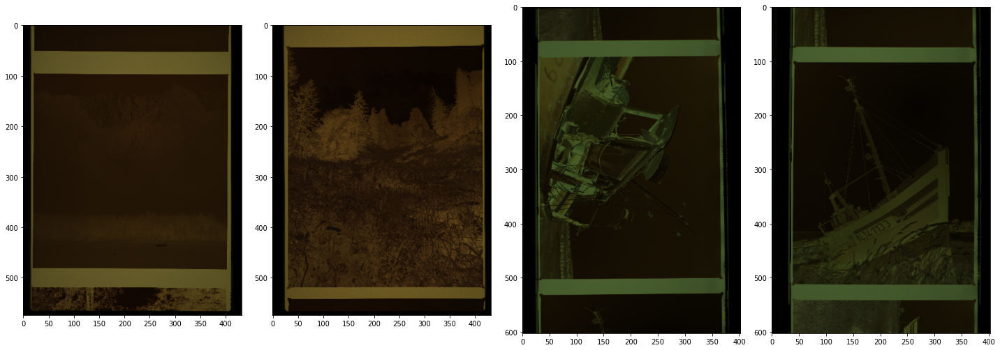

In [34]:
galleryshow(img_info, "pixels")

## Finding the negative in the input

### Increase contrast to clip range

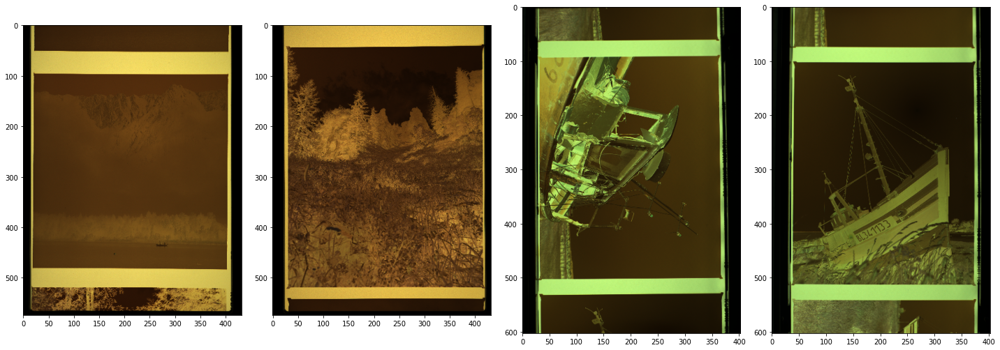

In [35]:
for i, info in enumerate(img_info):
    min_v = np.min(info["pixels"])
    max_v = np.max(info["pixels"])
    info["scaled"] = (info["pixels"] - min_v) * 1 / (max_v - min_v)

galleryshow(img_info, "scaled")

In [36]:
print("min/max in scaled images")
for info in img_info:
    print(f"min: {np.min(info['scaled'])}, max: {np.max(info['scaled'])}")

min/max in scaled images
min: 0.0, max: 1.0
min: 0.0, max: 1.0
min: 0.0, max: 1.0
min: 0.0, max: 1.0


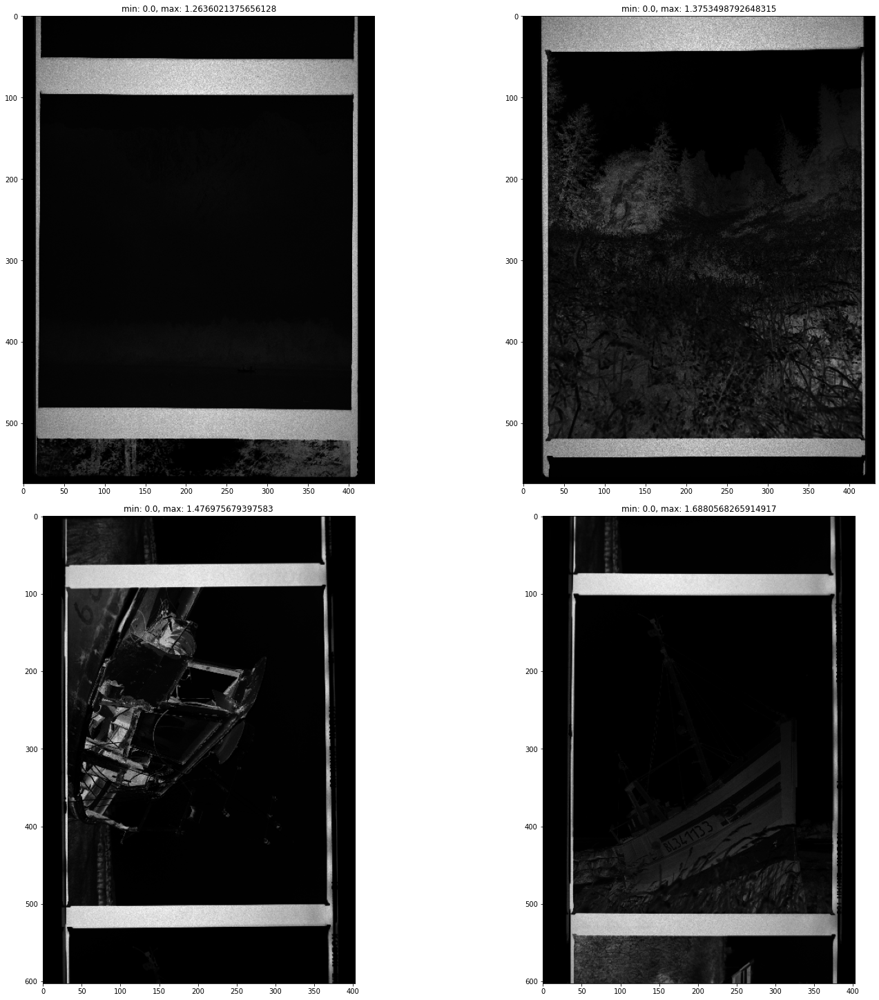

In [37]:
cols = ceil(len(img_info) / 2)
rows = ceil(len(img_info) / cols)
fig, axes = plt.subplots(ncols=cols, nrows=rows, constrained_layout=True)
ax = axes.ravel()

for i, info in enumerate(img_info):
    temp = info["pixels"][:, :, 2] ** 2
    
    min_v = np.min(temp)
    max_v = np.max(temp)
    upper_percentile = np.percentile(temp, 88)
    scale_max = (upper_percentile + max_v) / 2
    info["blue_scaled"] = (temp - min_v) / (scale_max - min_v)

    ax[i].imshow(info["blue_scaled"], cmap="gray")
    ax[i].set_title(f"min: {np.min(info['blue_scaled'])}, max: {np.max(info['blue_scaled'])}")


# galleryshow(img_info, "blue_scaled")

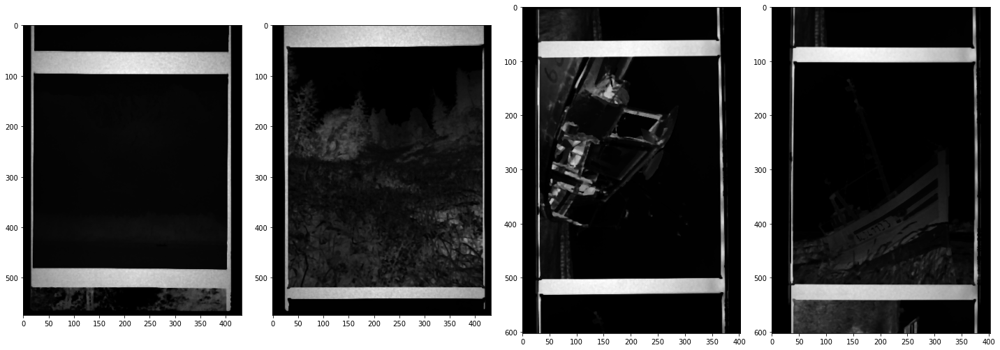

In [38]:
from skimage.filters import median
from skimage.morphology import disk

for i, info in enumerate(img_info):
    info["blue_scaled_median"] = median(info["blue_scaled"], disk(2))

galleryshow(img_info, "blue_scaled_median")

### Threshold to isolate boundaries

0.20161195635795615
0.23581291735172272
0.18498511612415314
0.1748989075422287


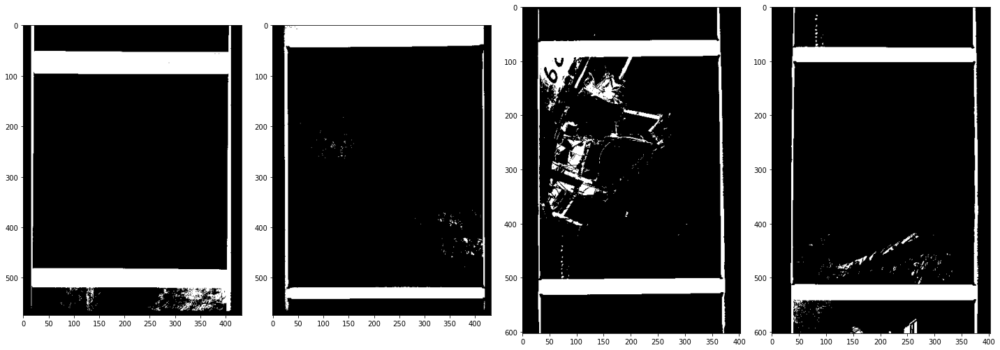

In [39]:
from skimage.filters import threshold_li, threshold_local

def find_mask(image):
    # threshold = threshold_li(image)
    # threshold = threshold_local(image)
    threshold = np.percentile(image, 88)

    print(threshold)
    mask = image.copy().mean(axis=2)
    # threshold = 0.3
    # mask[mask >= threshold] = 1
    # mask[mask < threshold] = 0
    mask = mask > threshold

    return mask

for i, img in enumerate(img_info):
    img["mask"] = find_mask(img["pixels"])

galleryshow(img_info, "mask")

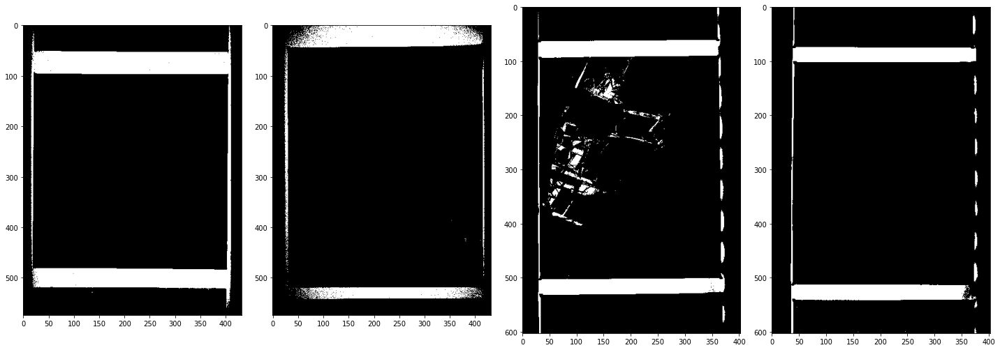

In [40]:
def find_mask(image):
    threshold = 0.58

    mask = image.copy().mean(axis=2)
    mask = mask > threshold

    return mask

for i, img in enumerate(img_info):
    img["mask_scaled"] = find_mask(img["scaled"])

galleryshow(img_info, "mask_scaled")

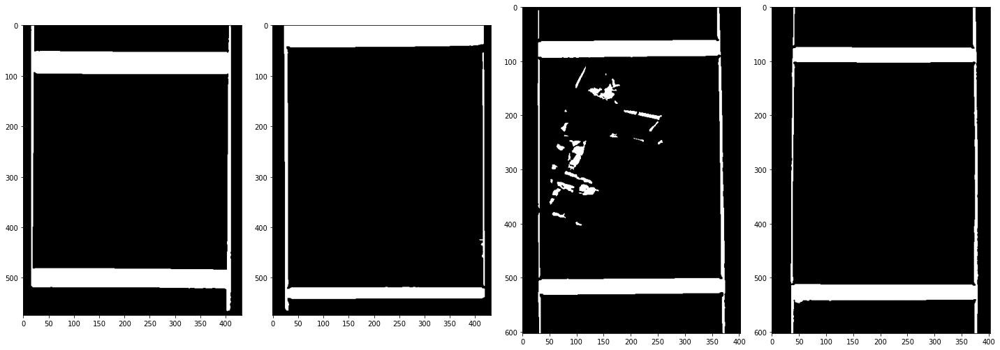

In [41]:
from skimage.filters import apply_hysteresis_threshold
def find_mask(image):
    # th_low = 0.65
    # th_high = 0.7
    th_low = 0.5
    th_high = 0.7

    mask = apply_hysteresis_threshold(image, th_low, th_high)

    return mask.astype(np.float32)

for i, img in enumerate(img_info):
    img["mask_scaled_hysteresis"] = find_mask(img["blue_scaled_median"])

galleryshow(img_info, "mask_scaled_hysteresis")

block size: 575
block size: 575
block size: 603
block size: 603


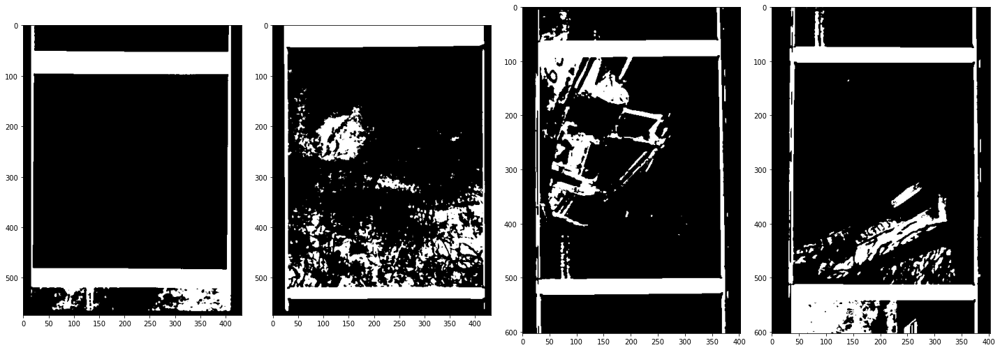

In [42]:
from skimage.filters import threshold_local
def find_mask(image):
    bsize = np.max(image.shape[:2])
    bsize += (bsize + 1) % 2
    print(f"block size: {bsize}")
    # mask = threshold_local(image, block_size=bsize, method="mean")
    mask = image > threshold_local(image, block_size=bsize, method="mean")

    return mask.astype(np.float32)

for i, img in enumerate(img_info):
    img["mask_local_thresh"] = find_mask(img["blue_scaled_median"])

galleryshow(img_info, "mask_local_thresh")

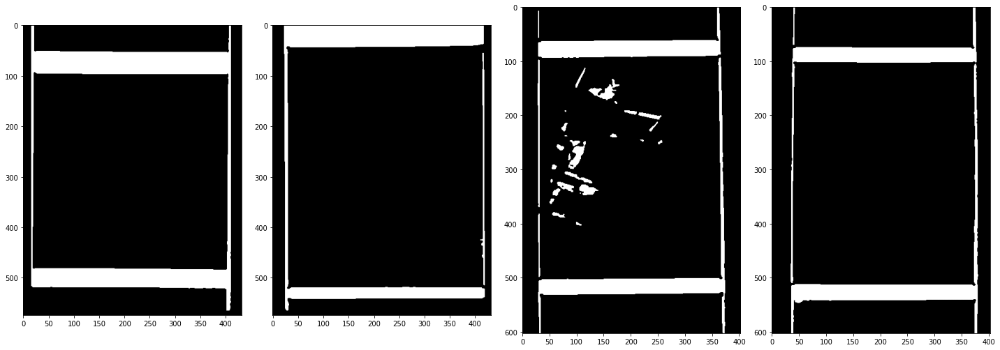

In [43]:
from skimage.filters import median
from skimage.morphology import disk

for i, info in enumerate(img_info):
    info["mask_median"] = median(info["mask_scaled_hysteresis"], disk(2))

galleryshow(img_info, "mask_median")

In [44]:
# MASK_K = "mask"
# MASK_K = "mask_scaled"
# MASK_K = "mask_scaled_hysteresis"
# MASK_K = "mask_median"
MASK_K = "mask_scaled_hysteresis"

### Find edges

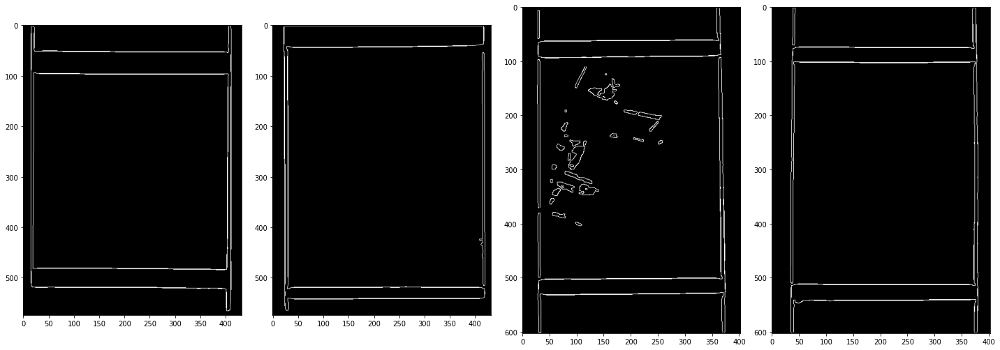

In [45]:
from skimage.feature import canny

def find_edges(mask):
    return canny(mask)

for i, img in enumerate(img_info):
    img["edges"] = find_edges(img[MASK_K])

galleryshow(img_info, "edges")

### Turn edges into (long-ish) lines

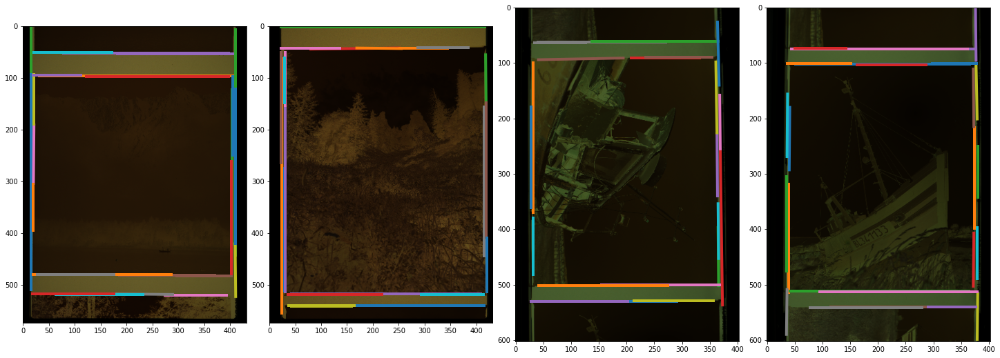

In [46]:
from skimage.transform import probabilistic_hough_line

def find_lines(edges):
    shortest = np.min(edges.shape[:2])
    return probabilistic_hough_line(edges,
        threshold=5,
        line_length=int(shortest * 0.2),
        line_gap=5)

for i, img in enumerate(img_info):
    img["lines"] = find_lines(img["edges"])

fig, axes = plt.subplots(ncols=len(img_info), constrained_layout=True)

for i, info in enumerate(img_info):
    ax = axes[i]
    ax.imshow(info["pixels"])

    for line in info["lines"]:
        p0, p1 = line
        ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4)

### Glue: Angle calculation

In [47]:
def unit_vector(vector):
    """ Returns the unit vector of the vector."""
    return vector / np.linalg.norm(vector)

def vec_angle(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> vec_angle((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> vec_angle((1, 0, 0), (1, 0, 0))
            0.0
            >>> vec_angle((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.degrees(np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)))

### Sort lines into left, right, top and bottom

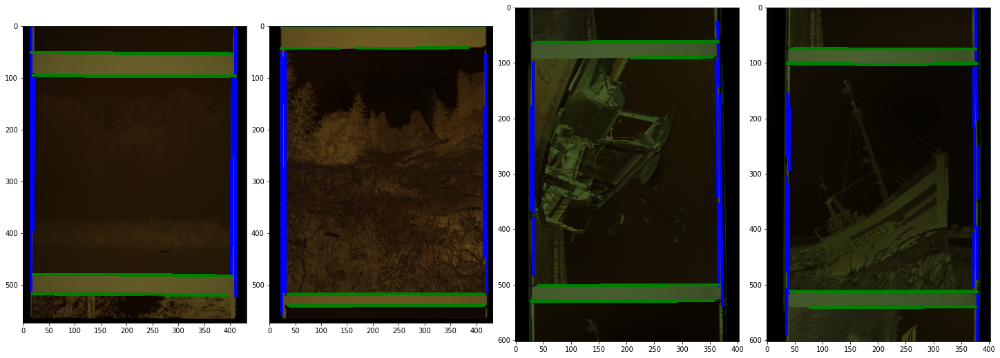

In [48]:
# sort lines into vertical and horizontal

angle_tolerance = 4

fig, axes = plt.subplots(ncols=len(img_info), constrained_layout=True)

for i, info in enumerate(img_info):
    info["horizontal"] = [l for l in info["lines"] if vec_angle(np.array(l[0]) - np.array(l[1]), (1, 0)) < angle_tolerance]
    info["vertical"]   = [l for l in info["lines"] if vec_angle(np.array(l[0]) - np.array(l[1]), (0, 1)) < angle_tolerance]

    ax = axes[i]
    ax.imshow(info["pixels"])

    for line in info["vertical"]:
        p0, p1 = line
        ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="b")

    for line in info["horizontal"]:
        p0, p1 = line
        ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="g")


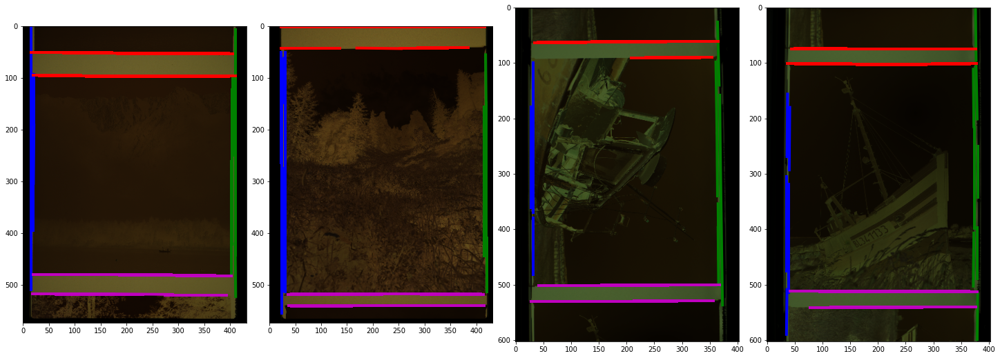

In [49]:
# sort vertical and horizontal lines into left/right and top/bottom

fig, axes = plt.subplots(ncols=len(img_info), constrained_layout=True)

for i, info in enumerate(img_info):
    center = np.array(info["pixels"].shape[:2]) / 2

    info["v_left"]  = [l for l in info["vertical"] if l[0][0] < center[1] and l[1][0] < center[1]]
    info["v_right"] = [l for l in info["vertical"] if l[0][0] > center[1] and l[1][0] > center[1]]

    info["h_top"]    = [l for l in info["horizontal"] if l[0][1] < center[0] and l[1][1] < center[0]]
    info["h_bottom"] = [l for l in info["horizontal"] if l[0][1] > center[0] and l[1][1] > center[0]]

    ax = axes[i]
    ax.imshow(info["pixels"])

    for line in info["v_left"]:
        p0, p1 = line
        ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="b")

    for line in info["v_right"]:
        p0, p1 = line
        ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="g")

    for line in info["h_top"]:
        p0, p1 = line
        ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="r")

    for line in info["h_bottom"]:
        p0, p1 = line
        ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="m")

### Select innermost lines from each category

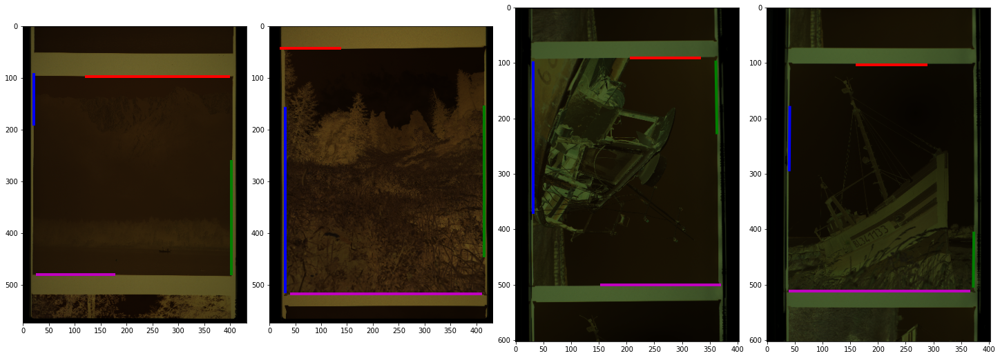

In [50]:
fig, axes = plt.subplots(ncols=len(img_info), constrained_layout=True)

for i, info in enumerate(img_info):

    img_shape = (info["pixels"].shape[:2][1], info["pixels"].shape[:2][0])

    info["left"] = ((0, 0), (0, 0))
    for line in info["v_left"]:
        line_x_avg = (line[0][0] + line[1][0]) / 2
        left_x_avg = (info["left"][0][0] + info["left"][1][0]) / 2
        if line_x_avg > left_x_avg:
            info["left"] = line

    info["right"] = (img_shape, img_shape)
    for line in info["v_right"]:
        line_x_avg = (line[0][0] + line[1][0]) / 2
        right_x_avg = (info["right"][0][0] + info["right"][1][0]) / 2
        if line_x_avg < right_x_avg:
            info["right"] = line

    info["top"] = ((0, 0), (0, 0))
    for line in info["h_top"]:
        line_y_avg = (line[0][1] + line[1][1]) / 2
        top_y_avg = (info["top"][0][1] + info["top"][1][1]) / 2
        if line_y_avg > top_y_avg:
            info["top"] = line

    info["bottom"] = (img_shape, img_shape)
    for line in info["h_bottom"]:
        line_y_avg = (line[0][1] + line[1][1]) / 2
        bottom_y_avg = (info["bottom"][0][1] + info["bottom"][1][1]) / 2
        if line_y_avg < bottom_y_avg:
            info["bottom"] = line

    ax = axes[i]
    ax.imshow(info["pixels"])

    p0, p1 = info["left"]
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="b")

    p0, p1 = info["right"]
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="g")

    p0, p1 = info["top"]
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="r")

    p0, p1 = info["bottom"]
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]), lw=4, color="m")

### Crop image according to found lines (assuming no affine transform is necessary)

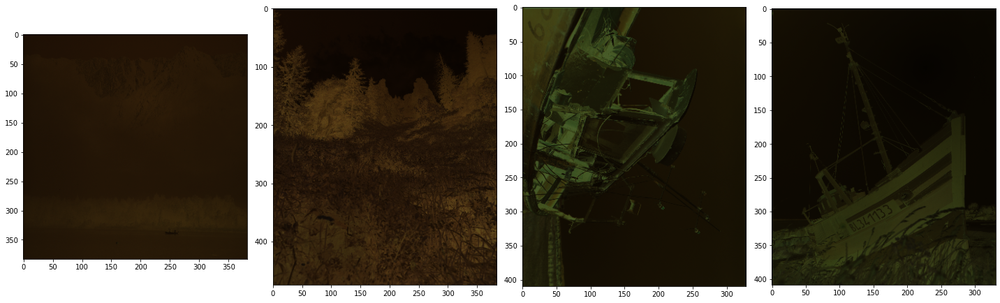

In [51]:
for i, info in enumerate(img_info):
    left, right, top, bottom = info["left"], info["right"], info["top"], info["bottom"]
    info["cropped"] = info["pixels"][
        min(top[0][1], top[1][1]) : max(bottom[0][1], bottom[1][1]),
        max(left[0][0], left[1][0]) : min(right[0][0], right[1][0])
        ]

galleryshow(img_info, "cropped")

### Crop image to found lines (with affine transform)

In [ ]:
# TODO

## As a reward for all that hard work: balance and invert the image

In [52]:
for i, info in enumerate(img_info):
    mask_3chan = np.stack((info[MASK_K], info[MASK_K], info[MASK_K]))
    mask_3chan = np.moveaxis(mask_3chan, 0, 2)
    print("shapes:", mask_3chan.shape, info["pixels"].shape)
    info["base"] = np.average(info["pixels"], axis=(0, 1), weights=mask_3chan)
    print(f"base: {info['base']}")

shapes: (574, 432, 3) (574, 432, 3)
base: [0.37322128 0.33736405 0.14972559]
shapes: (574, 432, 3) (574, 432, 3)
base: [0.39542887 0.32739037 0.12816787]
shapes: (603, 403, 3) (603, 403, 3)
base: [0.26002902 0.33708316 0.16350612]
shapes: (603, 403, 3) (603, 403, 3)
base: [0.25618857 0.3337556  0.16428186]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


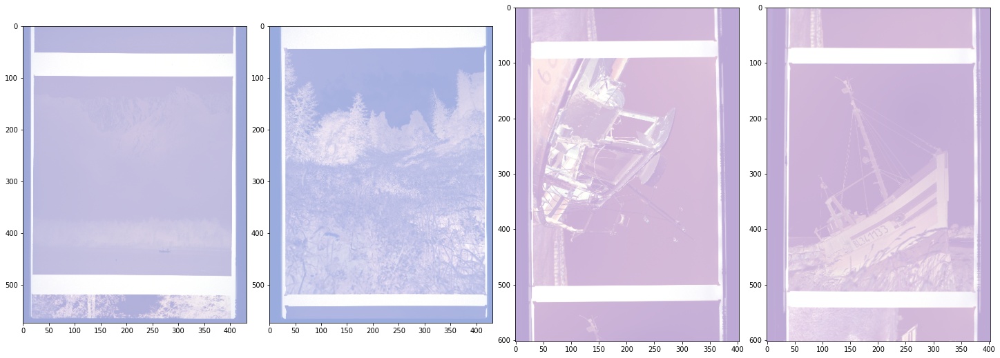

In [53]:
fig, axes = plt.subplots(ncols=len(img_info), constrained_layout=True)
for i, info in enumerate(img_info):
    info["offset"] = 1 - info["base"]
    axes[i].imshow(info["pixels"] + info["offset"])

### Colour balance using Rawpy white balance

processing image 1 of 4
[0.62065566, 1.0, 3.2455125, 1.0]
processing image 2 of 4
[0.62482566, 1.0, 2.6815786, 1.0]
processing image 3 of 4
[0.91340405, 1.0, 3.2219532, 1.0]
processing image 4 of 4
[0.8996502, 1.0, 3.1867325, 1.0]


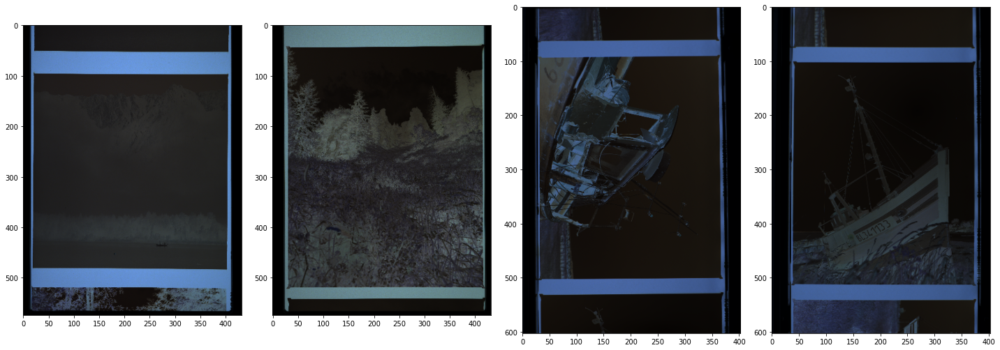

In [54]:
for i, info in enumerate(img_info):
    print(f"processing image {i + 1} of {len(img_info)}")

    avg_r = np.mean(info["cropped"][..., 0])
    avg_g = np.mean(info["cropped"][..., 1])
    avg_b = np.mean(info["cropped"][..., 2])

    wb = [avg_g/avg_r, 1.0, avg_g/avg_b, 1.0]

    print(wb)

    info["white_balanced"] = np.array(info["raw_data"].postprocess(
                half_size=True,
                output_color=rawpy.ColorSpace.raw,
                output_bps=16,
                gamma=(1, 1),
                user_wb=wb,
                no_auto_bright=True
                ), dtype=np.float32) / np.iinfo(np.uint16).max

    # low res proxy
    _stride = int(np.min(info["white_balanced"].shape[:2]) / 400)
    info["white_balanced"] = info["white_balanced"][::_stride, ::_stride]
    info["white_balanced"] = np.rot90(info["white_balanced"], k=1, axes=(0, 1))
    info["white_balanced"] = np.fliplr(info["white_balanced"])
    info["white_balanced"] = info["white_balanced"]

galleryshow(img_info, "white_balanced")

In [55]:
for i, info in enumerate(img_info):
    left, right, top, bottom = info["left"], info["right"], info["top"], info["bottom"]
    info["wb_cropped"] = info["white_balanced"][
        min(top[0][1], top[1][1]) : max(bottom[0][1], bottom[1][1]),
        max(left[0][0], left[1][0]) : min(right[0][0], right[1][0])
        ]

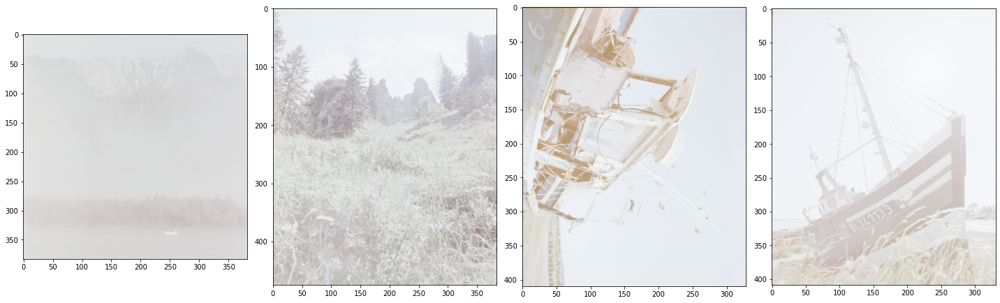

In [56]:
for i, info in enumerate(img_info):
    info["rawpy_inv"] = (1 - info["wb_cropped"])
galleryshow(img_info, "rawpy_inv")

[0.8545461  0.8545482  0.85452634]
[0.83998775 0.8398874  0.83985376]
[0.88128644 0.88137174 0.88134164]
[0.9152469 0.9152437 0.9151489]


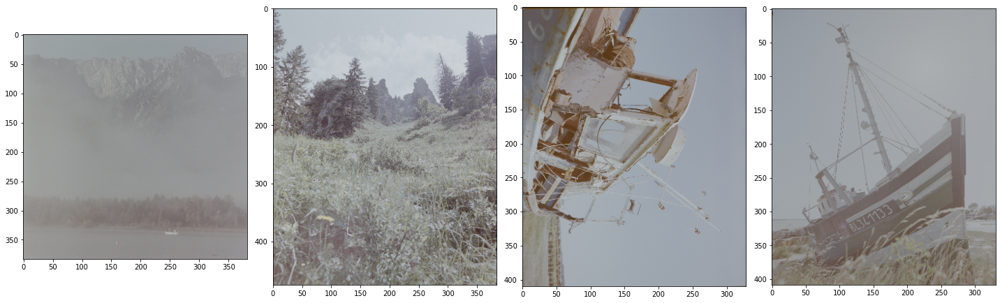

In [57]:
for i, info in enumerate(img_info):
    info["rawpy_inv_avg"] = np.mean(info["rawpy_inv"], axis=(0, 1))
    print(info["rawpy_inv_avg"])

    info["rawpy_graded"] = (info["rawpy_inv"] * (1/info["rawpy_inv_avg"]) * 0.8) ** 2.5

galleryshow(img_info, "rawpy_graded")
# TODO: this seems to be a decent algorithm - can we avoid the second raw conversion?

### Manual colour balance

In [58]:
# manual_wb = (input + offset)
manual_wb = input * wb[:3]
imshow(manual_wb)

TypeError: can't multiply sequence by non-int of type 'method'

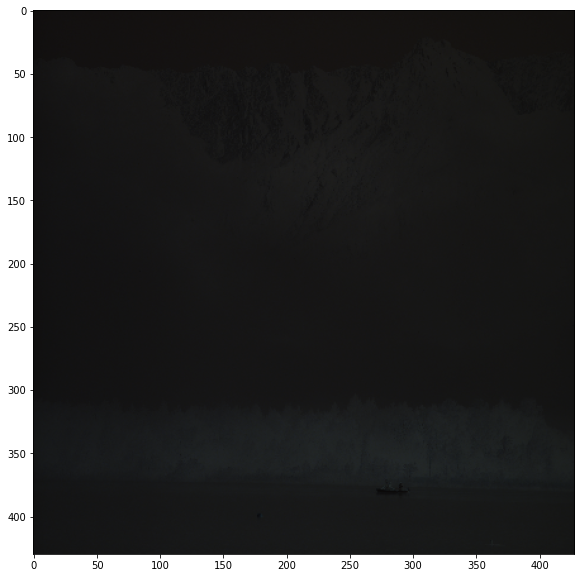

In [ ]:
manual_wb_cropped = manual_wb[
    min(top[0][1], top[1][1]) : max(bottom[0][1], bottom[1][1]),
    max(left[0][0], left[1][0]) : min(right[0][0], right[1][0])
    ]

imshow(manual_wb_cropped)

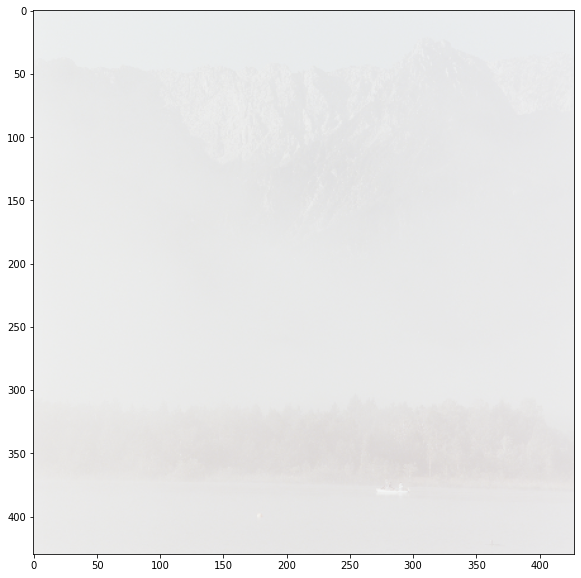

In [ ]:
m_inv = 1 - manual_wb_cropped

imshow(m_inv)

In [ ]:
m_inv_avg = np.mean(m_inv, axis=(0, 1))
print(m_inv_avg)

[0.90985104 0.90985104 0.90985104]


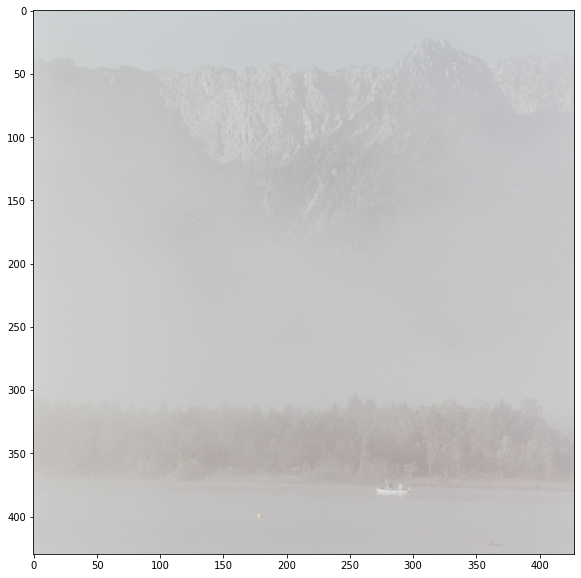

In [ ]:
imshow((m_inv * (1/m_inv_avg) * 0.9) ** 2.5)